In [1]:
import numpy as np
import pandas as pd
import nltk
from nltk.sentiment import SentimentIntensityAnalyzer
from textblob import TextBlob
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction import _stop_words

In [2]:
reddit_df = pd.read_csv("Cleaned_dataset.csv")

In [3]:
reddit_df.head()

,Unnamed: 0,ID,Timestamp,Upvotes,Comments,Cleaned_Title,Cleaned_Content
0,0,1j6j0hp,2025-03-08 15:04:18,1,0,hoowee dark week end nigh,sooner optimistically posted rcptsd depression...
1,1,1j6itc3,2025-03-08 14:54:40,1,0,im tired fucking existential crisis,want play videogames im thinking remember real...
2,2,1j6ioj2,2025-03-08 14:48:04,3,0,want emotional pain,whenever feel free anxiety depression sadness ...
3,3,1j6ijka,2025-03-08 14:41:05,1,0,feeling like someone deserves feel way,years years ive said bad things ive done bad t...
4,4,1j6hm3j,2025-03-08 13:53:34,5,4,motivation move,hi ive always bit life since younger always us...


In [4]:
nltk.download("vader_lexicon")
sia = SentimentIntensityAnalyzer()

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\shiva\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


In [5]:
reddit_df["Combined_Text"] = reddit_df["Cleaned_Title"]  + " " + reddit_df["Cleaned_Content"]

def get_vader_sentiment(text):
    score = sia.polarity_scores(text)["compound"]
    if score > 0.2:
        return "Positive"
    elif score < -0.2:
        return "Negative"
    else:
        return "Neutral"

reddit_df["Sentiment"] = reddit_df["Combined_Text"].apply(get_vader_sentiment)

tfidf = TfidfVectorizer(max_features=1000, stop_words="english", ngram_range=(1,2))
tfidf_matrix = tfidf.fit_transform(reddit_df["Combined_Text"])
feature_names = tfidf.get_feature_names_out()

tfidf_scores = pd.DataFrame(tfidf_matrix.toarray(), columns=feature_names)
Important_Terms = tfidf_scores.mean().sort_values(ascending=False)[:20].index.tolist()

def classify_risk(text, sentiment):
    text = text.lower()
    high_risk_terms = ["suicide","suicidal", "kill myself", "end it", "i give up", "overdose", "goodbye", "can't go on", "commit suicide", "die", "kill", "attempt","ending life", "end life"]
    moderate_risk_terms = ["depressed", "addiction", "rehab", "cannabis", "molly", "heroin", "marijuana", "fentanyl", "pot", "hopeless", "numb", "empty", "need help", "worthless", "anxious", "panic attack", "im high", "drug"]


    if sentiment == "Negative" or sentiment=="Neutral":
        if any(term in text for term in high_risk_terms):
            return "High-Risk"
        elif any(term in text for term in moderate_risk_terms):
            return "Moderate Concern"

    return "Low Concern"

reddit_df["Risk_Level"] = reddit_df.apply(lambda row: classify_risk(row["Combined_Text"], row["Sentiment"]), axis=1)

C:\Users\shiva\AppData\Local\Temp\ipykernel_3604\4259893601.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=sentiment_counts.index, y=sentiment_counts.values, palette={"Positive": "green", "Neutral": "gray", "Negative": "red"})


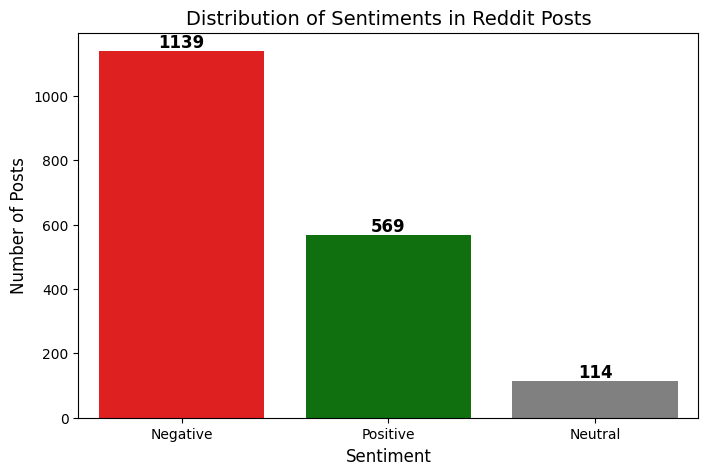

In [6]:
sentiment_counts = reddit_df["Sentiment"].value_counts()

plt.figure(figsize=(8, 5))
sns.barplot(x=sentiment_counts.index, y=sentiment_counts.values, palette={"Positive": "green", "Neutral": "gray", "Negative": "red"})

plt.xlabel("Sentiment", fontsize=12)
plt.ylabel("Number of Posts", fontsize=12)
plt.title("Distribution of Sentiments in Reddit Posts", fontsize=14)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)

for index, value in enumerate(sentiment_counts.values):
    plt.text(index, value + 10, str(value), ha="center", fontsize=12, fontweight="bold")

plt.show()

C:\Users\shiva\AppData\Local\Temp\ipykernel_3604\2300412154.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=risk_counts.index, y=risk_counts.values, palette={"Low Concern": "green", "Moderate Concern": "gray", "High-Risk": "red"})


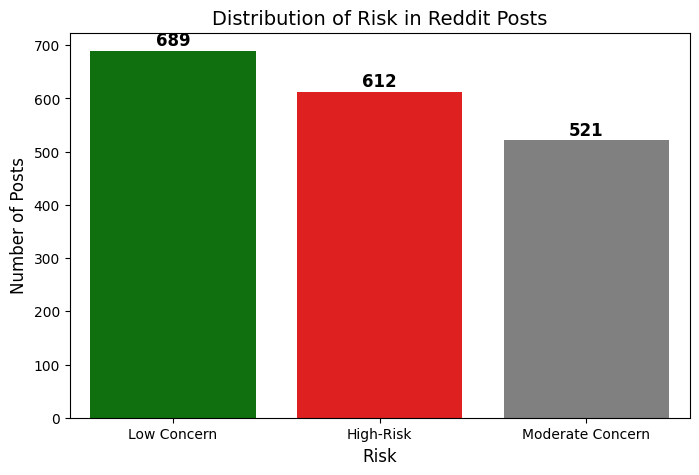

In [7]:
risk_counts = reddit_df["Risk_Level"].value_counts()

plt.figure(figsize=(8, 5))
sns.barplot(x=risk_counts.index, y=risk_counts.values, palette={"Low Concern": "green", "Moderate Concern": "gray", "High-Risk": "red"})

plt.xlabel("Risk", fontsize=12)
plt.ylabel("Number of Posts", fontsize=12)
plt.title("Distribution of Risk in Reddit Posts", fontsize=14)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)

for index, value in enumerate(risk_counts.values):
    plt.text(index, value + 10, str(value), ha="center", fontsize=12, fontweight="bold")

plt.show()

In [8]:
temp = reddit_df["Risk_Level"] == "Moderate Concern"
temp = reddit_df[temp]
temp = temp["Combined_Text"]
temp

2       want emotional pain whenever feel free anxiety...
3       feeling like someone deserves feel way years y...
5       writing sometimes cant get back lost feel like...
8       depressed lazy got sick overnight hate life mo...
9       broke front tooth years braces making depresse...
                              ...                        
1711    im tired im sorry long annoying need vent some...
1725    really teetering edge finally know want todo l...
1758    really need help hello im dealing depression a...
1775    please give reasons stay everything falling ap...
1815    dont know feel part im fine day feel numb nigh...
Name: Combined_Text, Length: 521, dtype: object

In [9]:
pd.set_option("display.max_rows", None)
pd.set_option("display.max_columns", None)
pd.set_option("display.expand_frame_repr", False)
pd.set_option("display.max_colwidth", None)

In [10]:
negative_texts = reddit_df[reddit_df["Sentiment"].isin(["Negative", "Neutral"])]["Combined_Text"]
high_risk_texts = reddit_df[reddit_df["Risk_Level"] == "High-Risk"]["Combined_Text"]
moderate_risk_texts = reddit_df[reddit_df["Risk_Level"]=="Moderate Concern"]["Combined_Text"]


In [11]:

tfidf_high = TfidfVectorizer(
    max_features=500,
    stop_words="english",
    ngram_range=(1, 2),
    min_df=3,
    max_df=0.8

)
tfidf_moderate = TfidfVectorizer(
    max_features=500,
    stop_words="english",
    ngram_range=(1, 2),
    min_df=3,
    max_df=0.8

)
tfidf_high.fit(negative_texts)
tfidf_moderate.fit(negative_texts)
tfidf_matrix_high = tfidf_high.transform(high_risk_texts)
tfidf_matrix_moderate = tfidf_moderate.transform(moderate_risk_texts)
feature_names_high = tfidf_high.get_feature_names_out()
feature_names_moderate = tfidf_moderate.get_feature_names_out()

tfidf_scores_high = pd.DataFrame(tfidf_matrix_high.toarray(), columns=feature_names_high)
tfidf_scores_moderate = pd.DataFrame(tfidf_matrix_moderate.toarray(), columns=feature_names_moderate)
important_terms_high = tfidf_scores_high.mean().sort_values(ascending=False)[:30].index.tolist()
important_terms_moderate = tfidf_scores_moderate.mean().sort_values(ascending=False)[:30].index.tolist()

print(f"High risk terms:{important_terms_high}\n")
print(f"Moderate risk terms:{important_terms_moderate}")


High risk terms:['im', 'dont', 'want', 'like', 'feel', 'life', 'know', 'die', 'ive', 'suicidal', 'people', 'really', 'dont know', 'years', 'time', 'help', 'going', 'think', 'anymore', 'hate', 'feel like', 'want die', 'day', 'thoughts', 'things', 'suicide', 'fucking', 'family', 'dont want', 'kill']

Moderate risk terms:['im', 'feel', 'dont', 'like', 'addiction', 'ive', 'know', 'life', 'want', 'time', 'depressed', 'really', 'day', 'help', 'need', 'dont know', 'years', 'stop', 'people', 'going', 'feeling', 'feel like', 'got', 'think', 'bad', 'anxiety', 'things', 'way', 'work', 'depression']


In [12]:
generic_words=[]
for i in important_terms_high:
  if i in Important_Terms:
    generic_words.append(i)


for i in important_terms_moderate:
  if i in Important_Terms:
    generic_words.append(i)

generic_words

['im',
 'dont',
 'want',
 'like',
 'feel',
 'life',
 'know',
 'ive',
 'people',
 'really',
 'dont know',
 'years',
 'time',
 'help',
 'going',
 'think',
 'feel like',
 'day',
 'im',
 'feel',
 'dont',
 'like',
 'addiction',
 'ive',
 'know',
 'life',
 'want',
 'time',
 'really',
 'day',
 'help',
 'need',
 'dont know',
 'years',
 'people',
 'going',
 'feel like',
 'think']

In [13]:
custom_stopwords = set(_stop_words.ENGLISH_STOP_WORDS).union(generic_words)
custom_stopwords = list(custom_stopwords)
tfidf_new_high = TfidfVectorizer(
    max_features=500,
    stop_words=custom_stopwords,
    ngram_range=(1, 2),
    min_df=3,
    max_df=0.8 )
tfidf_new_moderate = TfidfVectorizer(
    max_features=500,
    stop_words=custom_stopwords,
    ngram_range=(1, 2),
    min_df=3,
    max_df=0.8 )
tfidf_new_high.fit(negative_texts)
tfidf_new_moderate.fit(negative_texts)
tfidf_matrix_new_high = tfidf_new_high.transform(high_risk_texts)
tfidf_matrix_new_moderate = tfidf_new_moderate.transform(moderate_risk_texts)
feature_names_new_high = tfidf_new_high.get_feature_names_out()
feature_names_new_moderate = tfidf_new_moderate.get_feature_names_out()


tfidf_scores_new_high = pd.DataFrame(tfidf_matrix_new_high.toarray(), columns=feature_names_new_high)
tfidf_scores_new_moderate = pd.DataFrame(tfidf_matrix_new_moderate.toarray(), columns=feature_names_new_moderate)
important_terms_new_high = tfidf_scores_new_high.mean().sort_values(ascending=False)[:150].index.tolist()
important_terms_new_moderate = tfidf_scores_new_moderate.mean().sort_values(ascending=False)[:150].index.tolist()

print("Refined High-Risk Terms:", important_terms_new_high)
print("\n")
print("Refined Moderate-Risk Terms:", important_terms_new_moderate)

Refined High-Risk Terms: ['die', 'suicidal', 'anymore', 'hate', 'suicide', 'things', 'thoughts', 'fucking', 'kill', 'family', 'live', 'way', 'got', 'didnt', 'friends', 'job', 'end', 'depression', 'work', 'school', 'talk', 'tired', 'make', 'pain', 'better', 'depressed', 'feeling', 'care', 'bad', 'say', 'person', 'lost', 'tried', 'try', 'ill', 'parents', 'told', 'said', 'good', 'wish', 'suicidal thoughts', 'scared', 'year', 'thought', 'started', 'stop', 'trying', 'point', 'doesnt', 'feels', 'love', 'living', 'tell', 'thats', 'thinking', 'thing', 'hard', 'times', 'right', 'felt', 'worse', 'getting', 'old', 'hes', 'months', 'away', 'mind', 'shit', 'world', 'mom', 'left', 'lot', 'death', 'mental', 'self', 'ago', 'wanted', 'days', 'reason', 'long', 'hurt', 'sleep', 'wanna', 'maybe', 'home', 'killing', 'actually', 'money', 'used', 'went', 'friend', 'dad', 'struggling', 'able', 'shes', 'happy', 'makes', 'past', 'anxiety', 'week', 'body', 'id', 'wont', 'drugs', 'wasnt', 'wrong', 'sad', 'theres'

In [14]:
distinct_high_risk_terms = list(set(important_terms_new_high) - set(important_terms_new_moderate))
print("Distinct High-Risk Terms:", distinct_high_risk_terms)

Distinct High-Risk Terms: ['died', 'understand', 'death', 'friend', 'worthless', 'idk', 'stupid', 'college', 'killing', 'mother', 'alive', 'shes', 'kill', 'brain', 'today', 'said', 'little', 'world', 'room', 'suicidal thoughts', 'suicidal', 'dad', 'suicide', 'problems', 'everyday', 'house', 'thoughts', 'wasnt', 'care', 'head', 'gone', 'gets', 'hurt', 'believe', 'future', 'best', 'matter', 'leave', 'fuck', 'constantly', 'gonna', 'die']


In [15]:
distinct_moderate_risk_terms = list(set(important_terms_new_moderate) - set(important_terms_new_high))
print("Distinct moderate-Risk Terms:", distinct_moderate_risk_terms)

Distinct moderate-Risk Terms: ['quit', 'cause', 'cocaine', 'relationship', 'alcohol', 'use', 'normal', 'issues', 'problem', 'hours', 'guess', 'lonely', 'finally', 'whats', 'stay', 'real', 'using', 'change', 'drug', 'advice', 'numb', 'watching', 'addict', 'smoking', 'anxious', 'medication', 'sure', 'sober', 'struggle', 'social', 'starting', 'weed', 'panic', 'place', 'porn', 'couple', 'fear', 'addicted', 'phone', 'hopeless', 'looking', 'month']


In [16]:
from sklearn.feature_extraction.text import ENGLISH_STOP_WORDS

def filter_generic_words(word_list, additional_stopwords=None):
    """
    Removes generic words (stopwords, common Reddit terms, etc.) from a given word list.

    Args:
        word_list (list): List of words to filter.
        additional_stopwords (set): Optional additional words to remove.

    Returns:
        list: Filtered list with generic words removed.
    """

    reddit_stopwords = {"post", "deleted", "edit", "comments", "account", "people", "really",
                        "like", "just", "know", "think", "said", "man", "going","ok","tells", "asked","us","want","human", "im", "dont"}


    stopword_set = ENGLISH_STOP_WORDS.union(reddit_stopwords)
    if additional_stopwords:
        stopword_set = stopword_set.union(additional_stopwords)


    filtered_words = [word for word in word_list if word.lower() not in stopword_set]

    return filtered_words

In [17]:
negative_texts

1                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                       

In [18]:
from sklearn.feature_selection import chi2
import numpy as np

tfidf_shared = TfidfVectorizer(
    max_features=3000,
    stop_words="english",
    ngram_range=(1, 2),
    min_df=3,
    max_df=0.8
)
negative_df = reddit_df[reddit_df["Sentiment"].isin(["Negative", "Neutral"])]

X_combined = tfidf_shared.fit_transform(negative_texts)
y_combined = (negative_df["Risk_Level"] == "High-Risk").astype(int)

chi2_scores, p_values = chi2(X_combined, y_combined)
feature_names = tfidf_shared.get_feature_names_out()
top_chi2_indices = np.argsort(chi2_scores)[::-1][:60]
top_chi2_words = feature_names[top_chi2_indices]

significant_words = [word for i, word in enumerate(top_chi2_words) if p_values[top_chi2_indices[i]] < 0.25]
print("**Top High-Risk Indicator Words by Chi-Square Test (Filtered):**")
print(filter_generic_words(significant_words, additional_stopwords=None))

**Top High-Risk Indicator Words by Chi-Square Test (Filtered):**
['die', 'suicidal', 'want die', 'suicide', 'kill', 'suicidal thoughts', 'addiction', 'killing', 'porn', 'thoughts', 'died', 'fucking', 'attempt', 'death', 'live', 'im suicidal', 'skills', 'want kill', 'quit', 'killed', 'attempts', 'addicted', 'ideation', 'weed', 'die im', 'cravings', 'commit suicide', 'life', 'ive suicidal', 'commit', 'suicidal ideation', 'siblings', 'relapse', 'alive', 'kill im', 'hospital', 'goodbye', 'care', 'die dont', 'attempted', 'suffer', 'smoking', 'feeling suicidal', 'going kill', 'die want', 'end life', 'addictions', 'want live', 'overdose', 'relapsed', 'kms', 'hurt', 'addict', 'truly', 'panic', 'symptoms', 'ending life', 'hate']


In [19]:
tfidf_shared_moderate = TfidfVectorizer(
    max_features=3000,
    stop_words="english",
    ngram_range=(1, 2),
    min_df=0.0,
    max_df=0.8
)


X_combined_moderate = tfidf_shared_moderate.fit_transform(reddit_df["Combined_Text"])
y_combined_moderate = (reddit_df["Risk_Level"] == "Moderate Concern").astype(int)

chi2_scores_moderate, p_values_moderate = chi2(X_combined_moderate, y_combined_moderate)
feature_names_moderate = tfidf_shared_moderate.get_feature_names_out()
top_chi2_indices_moderate = np.argsort(chi2_scores_moderate)[::-1][:60]
top_chi2_words_moderate = feature_names_moderate[top_chi2_indices_moderate]

significant_words_moderate = [word for i, word in enumerate(top_chi2_words_moderate) if p_values_moderate[top_chi2_indices_moderate[i]] < 0.25]
print("**Top Moderate-Risk Indicator Words by Chi-Square Test (Filtered):**")
print(filter_generic_words(significant_words_moderate, additional_stopwords=significant_words))

**Top Moderate-Risk Indicator Words by Chi-Square Test (Filtered):**
['depressed', 'anxious', 'panic attacks', 'attacks', 'numb', 'panic attack', 'instagram', 'ssris', 'attack', 'derealization', 'triggered', 'love', 'dishes', 'visa', 'anxiety', 'friend', 'im depressed', 'best', 'feeling depressed', 'lost', 'overwhelmed', 'acts', 'community', 'test', 'realizing', 'highschool', 'best friend', 'stressed', 'regularly']


In [20]:
from gensim.models import Word2Vec
import nltk
nltk.download('punkt')


negative_texts["Tokenized"] = negative_texts.apply(lambda x: nltk.word_tokenize(x) if isinstance(x, str) else [])
moderate_risk_texts["Tokenized"] = moderate_risk_texts.apply(lambda x: nltk.word_tokenize(x) if isinstance(x, str) else [])
w2v_model = Word2Vec(sentences=negative_texts["Tokenized"], vector_size=100, window=5, min_count=3, workers=4)
w2v_model_moderate = Word2Vec(sentences=moderate_risk_texts["Tokenized"], vector_size=100, window=5, min_count=3, workers=4)

seed_words = filter_generic_words(significant_words)
seed_words_moderate = filter_generic_words(significant_words_moderate)
expanded_words = {}
expanded_words_moderate= {}
for word in seed_words:
    if word in w2v_model.wv:
        expanded_words[word] = filter_generic_words([w[0] for w in w2v_model.wv.most_similar(word, topn=10)], additional_stopwords=["simply","bring","knowing","continue","became","highschool","began","full","university","older","obviously","however","put","instead","check","name","true","writing","hobbies","fully","kinda","idk","point","normal","including","eventually"])

for word in seed_words_moderate:
    if word in w2v_model_moderate.wv:
        expanded_words_moderate[word] = filter_generic_words([w[0] for w in w2v_model_moderate.wv.most_similar(word, topn=10)], additional_stopwords=["simply","bring","knowing","continue","became","highschool","began","full","university","older","obviously","however","put","instead","check","name","true","writing","hobbies","fully","kinda","idk","point","normal","including","eventually"])
print("Expanded High-Risk Words:", expanded_words)
print("\n")
print("Expanded moderate-Risk Words:", expanded_words_moderate)

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\shiva\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
C:\Users\shiva\AppData\Local\Temp\ipykernel_3604\432821057.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  negative_texts["Tokenized"] = negative_texts.apply(lambda x: nltk.word_tokenize(x) if isinstance(x, str) else [])
C:\Users\shiva\AppData\Local\Temp\ipykernel_3604\432821057.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  moderate_risk_texts["Tokenized"] = moderate_risk_texts.apply(lambda x: nltk.word_tokenize(x) if isinstance(x, str) else [])


Expanded High-Risk Words: {'die': ['anymore', 'need', 'care'], 'suicidal': ['thoughts', 'gotten', 'struggling', 'passive', 'havent', 'january', 'depressive', 'harm', 'episode'], 'suicide': ['study', 'especially', 'probably', 'physically', 'stuff', 'crying', 'seeing', 'drugs'], 'kill': ['hurt', 'wish', 'right', 'hurting', 'understand', 'make', 'anybody'], 'addiction': ['drug', 'abuse', 'dealing', 'weed', 'age', 'daily', 'treatment', 'decided', 'car'], 'killing': ['hell', 'head', 'absolutely', 'cycle', 'deep', 'starting', 'face', 'everyday', 'free'], 'porn': ['alcohol', 'caused', 'addictions', 'quitting', 'food', 'cocaine', 'girl', 'intense', 'meth', 'daily'], 'thoughts': ['ideation', 'self', 'f', 'used', 'harm', 'struggling', 'heavy', 'daily', 'eating'], 'died': ['broke', 'ended', 'using', 'turned', 'brother', 'met', 'left', 'relationship', 'college'], 'fucking': ['life', 'end', 'deserve', 'way', 'kill', 'wish', 'right', 'fix'], 'attempt': ['heart', 'use', 'pretty', 'working', 'fear', '

In [21]:
results = {}
for key_word, words in expanded_words.items():

    valid_words = [word for word in words if word in feature_names_new_high]

    if not valid_words:
        continue


    high_risk_scores = tfidf_scores_new_high[valid_words].mean()
    moderate_risk_scores = tfidf_scores_new_moderate[valid_words].mean()


    score_difference = (high_risk_scores - moderate_risk_scores).sort_values(ascending=False)


    X_high = tfidf_matrix_new_high.toarray()
    X_moderate = tfidf_matrix_new_moderate.toarray()

    y_high = np.ones(X_high.shape[0])
    y_moderate = np.zeros(X_moderate.shape[0])

    X_combined = np.vstack((X_high, X_moderate))
    y_combined = np.hstack((y_high, y_moderate))

    chi2_scores, p_values = chi2(X_combined, y_combined)


    word_chi2_scores = {word: chi2_scores[np.where(feature_names_new_high == word)[0][0]]
                        for word in valid_words}


    results[key_word] = {
        "valid_words": valid_words,
        "score_difference": score_difference.to_dict(),
        "chi2_scores": word_chi2_scores
    }


df_results = pd.DataFrame.from_dict(results, orient='index')


print(df_results)

                                                                                    valid_words                                                                                                                                                                                                                                                                                                                             score_difference                                                                                                                                                                                                                                                                                                        chi2_scores
die                                                                             [anymore, care]                                                                                                                                                                         

In [22]:
df_results.shape
df_results.iloc[10]

valid_words                                                                                                                                                                                                                    [heart, use, pretty, working, fear, drugs, basically, helped]
score_difference    {'pretty': 0.0029811448587243536, 'basically': 0.0028066058431164467, 'working': 0.0010861184216784479, 'heart': -0.0003276789518429149, 'fear': -0.00148245495236754, 'helped': -0.0022144318059053565, 'use': -0.0036294376273397367, 'drugs': -0.0046840921482289195}
chi2_scores                            {'heart': 0.0035483806811491205, 'use': 0.33387979753570585, 'pretty': 0.3140457256434651, 'working': 0.03562086144300309, 'fear': 0.05747815615145074, 'drugs': 0.37235301752992467, 'basically': 0.3412007319165915, 'helped': 0.23591406734937187}
Name: attempt, dtype: object

In [23]:
chi2_values_00000 =df_results["chi2_scores"].apply(lambda x: np.mean(list(x.values())) if x else 0)

print(chi2_values_00000)

die           2.381024
suicidal      1.182457
suicide       0.123704
kill          0.787094
addiction     0.769666
killing       0.437578
porn          0.369521
thoughts      0.186487
died          0.572142
fucking       3.092704
attempt       0.211755
death         0.539215
live          1.108823
skills        1.380835
quit          0.737413
killed        1.297224
attempts      0.435023
addicted      1.461049
ideation      0.107126
weed          0.413029
cravings      0.224891
life          1.200041
commit        0.497708
siblings      0.261231
relapse       0.309616
alive         0.863397
hospital      0.332866
goodbye       0.396022
care          1.481392
attempted     0.145951
suffer        0.325190
smoking       0.399815
addictions    1.317356
overdose      0.069348
relapsed      0.133108
kms           0.400856
hurt          3.201528
addict        0.178287
truly         0.098132
panic         0.480850
symptoms      0.238509
hate          1.805663
Name: chi2_scores, dtype: float64


In [24]:
threshold_chi2 = 1

for key in df_results.index:
    valid_words = df_results.at[key, "valid_words"]
    chi2_scores = df_results.at[key, "chi2_scores"]
    score_diff = df_results.at[key, "score_difference"]

    filtered_words = [
        word for word in valid_words
        if chi2_scores.get(word, 0) >= threshold_chi2 and score_diff.get(word, 0) > 0
    ]

    filtered_chi2 = {word: chi2_scores[word] for word in filtered_words}
    filtered_score_diff = {word: score_diff[word] for word in filtered_words}

    df_results.at[key, "valid_words"] = filtered_words
    df_results.at[key, "chi2_scores"] = filtered_chi2
    df_results.at[key, "score_difference"] = filtered_score_diff

In [25]:
df_results

,valid_words,score_difference,chi2_scores
die,"[anymore, care]","{'anymore': 0.014948088081825236, 'care': 0.0137181489671118}","{'anymore': 1.8436028579994592, 'care': 2.918444457849667}"
suicidal,[thoughts],{'thoughts': 0.02274576975326655},{'thoughts': 6.25117380597952}
suicide,[],{},{}
kill,"[hurt, wish]","{'hurt': 0.009328881214245655, 'wish': 0.010721574060657862}","{'hurt': 1.8851651519506687, 'wish': 1.8218735129016241}"
addiction,[treatment],{'treatment': 0.004777412401269948},{'treatment': 1.5049241397349258}
killing,[],{},{}
porn,[],{},{}
thoughts,[],{},{}
died,[met],{'met': 0.004672085546059846},{'met': 1.0468375712450075}
fucking,"[end, kill, wish]","{'end': 0.011573313794411552, 'kill': 0.03347260586406735, 'wish': 0.010721574060657862}","{'end': 1.7120988535282962, 'kill': 17.439227655179074, 'wish': 1.8218735129016241}"


In [26]:
chi2_values_ = df_results["chi2_scores"].apply(lambda x: np.mean(list(x.values())) if x else 0)

print(chi2_values_)

die           2.381024
suicidal      6.251174
suicide       0.000000
kill          1.853519
addiction     1.504924
killing       0.000000
porn          0.000000
thoughts      0.000000
died          1.046838
fucking       6.991067
attempt       0.000000
death         2.490114
live          2.918444
skills        1.018665
quit          0.000000
killed        0.000000
attempts      1.504924
addicted      0.000000
ideation      0.000000
weed          0.000000
cravings      0.000000
life          3.411686
commit        1.939182
siblings      0.000000
relapse       1.866610
alive         2.905635
hospital      1.388273
goodbye       0.000000
care          4.569198
attempted     0.000000
suffer        1.226838
smoking       0.000000
addictions    0.000000
overdose      0.000000
relapsed      0.000000
kms           1.445286
hurt          9.365399
addict        0.000000
truly         0.000000
panic         0.000000
symptoms      0.000000
hate          4.840235
Name: chi2_scores, dtype: float64


In [27]:
filtered_chi2_values = chi2_values_[chi2_values_ > 0]
print(filtered_chi2_values)

die          2.381024
suicidal     6.251174
kill         1.853519
addiction    1.504924
died         1.046838
fucking      6.991067
death        2.490114
live         2.918444
skills       1.018665
attempts     1.504924
life         3.411686
commit       1.939182
relapse      1.866610
alive        2.905635
hospital     1.388273
care         4.569198
suffer       1.226838
kms          1.445286
hurt         9.365399
hate         4.840235
Name: chi2_scores, dtype: float64


In [28]:
filtered_rows = df_results.loc[chi2_values_ > 0]
High_risk_valid_words_dict = {}

for key in filtered_rows.index:
    valid_words = df_results.at[key, "valid_words"]
    High_risk_valid_words_dict[key] = valid_words

print(High_risk_valid_words_dict)

{'die': ['anymore', 'care'], 'suicidal': ['thoughts'], 'kill': ['hurt', 'wish'], 'addiction': ['treatment'], 'died': ['met'], 'fucking': ['end', 'kill', 'wish'], 'death': ['alive'], 'live': ['care'], 'skills': ['child'], 'attempts': ['treatment'], 'life': ['end', 'fucking'], 'commit': ['escape'], 'relapse': ['plan'], 'alive': ['death', 'pain'], 'hospital': ['room'], 'care': ['live'], 'suffer': ['god'], 'kms': ['loved'], 'hurt': ['love', 'kill'], 'hate': ['live', 'fucking']}


In [29]:
results_moderate = {}
for key_word, words in expanded_words_moderate.items():

    valid_words = [word for word in words if word in feature_names_new_moderate]

    if not valid_words:
        continue


    high_risk_scores = tfidf_scores_new_high[valid_words].mean()
    moderate_risk_scores = tfidf_scores_new_moderate[valid_words].mean()


    score_difference = (moderate_risk_scores - high_risk_scores).sort_values(ascending=False)


    X_high = tfidf_matrix_new_high.toarray()
    X_moderate = tfidf_matrix_new_moderate.toarray()

    y_high = np.zeros(X_high.shape[0])
    y_moderate = np.ones(X_moderate.shape[0])

    X_combined = np.vstack((X_moderate, X_high))
    y_combined = np.hstack((y_moderate, y_high))

    chi2_scores, p_values = chi2(X_combined, y_combined)


    word_chi2_scores = {word: chi2_scores[np.where(feature_names_new_moderate == word)[0][0]]
                        for word in valid_words}


    results_moderate[key_word] = {
        "valid_words": valid_words,
        "score_difference": score_difference.to_dict(),
        "chi2_scores": word_chi2_scores
    }


df_results_moderate = pd.DataFrame.from_dict(results_moderate, orient='index')


print(df_results_moderate)

                                                                           valid_words                                                                                                                                                                                                                                                                                         score_difference                                                                                                                                                                                                                                                                            chi2_scores
panic                 [person, past, night, relationship, porn, leave, family, reason]                                 {'porn': 0.018091256338862997, 'relationship': 0.004615221730125735, 'past': 0.0011320916327490615, 'night': 0.0009478870779399753, 'reason': -0.0010033250914084392, 'leave': -0.0027374673265805442, 'person': -0.008866

In [30]:
df_results_moderate.shape
df_results_moderate.iloc[10]

valid_words                                                                                                                                     [havent, looking, house, away, start]
score_difference    {'looking': 0.006154266580720237, 'start': 0.0021892488343861986, 'havent': 0.001089176239399704, 'away': -5.549768891703957e-05, 'house': -0.005059941370758599}
chi2_scores                   {'havent': 0.02451217228852766, 'looking': 1.0200365195070729, 'house': 0.6292600270067137, 'away': 4.451228569142283e-05, 'start': 0.0906668975695205}
Name: derealization, dtype: object

In [31]:
chi2_values_000 =df_results_moderate["chi2_scores"].apply(lambda x: np.mean(list(x.values())) if x else 0)

print(chi2_values_000)

panic            1.560802
depressed        0.114187
anxious          0.373114
addiction        0.487688
attacks          0.502099
numb             0.189975
instagram        0.827104
ssris            0.279880
thoughts         0.380196
attack           0.775549
derealization    0.352904
triggered        0.316000
love             0.078128
dishes           0.038467
visa             0.363732
anxiety          0.742239
friend           0.693999
best             0.856886
live             0.616834
lost             0.088425
overwhelmed      0.502246
acts             0.118722
test             1.179032
realizing        2.171369
care             1.032529
highschool       0.275165
stressed         0.269735
life             0.149855
regularly        0.579198
truly            0.234881
Name: chi2_scores, dtype: float64


In [32]:
threshold_chi2 = 1

for key in df_results_moderate.index:
    valid_words = df_results_moderate.at[key, "valid_words"]
    chi2_scores = df_results_moderate.at[key, "chi2_scores"]
    score_diff = df_results_moderate.at[key, "score_difference"]

    filtered_words = [
        word for word in valid_words
        if chi2_scores.get(word, 0) >= threshold_chi2 and score_diff.get(word, 0) > 0
    ]

    filtered_chi2 = {word: chi2_scores[word] for word in filtered_words}
    filtered_score_diff = {word: score_diff[word] for word in filtered_words}

    df_results_moderate.at[key, "valid_words"] = filtered_words
    df_results_moderate.at[key, "chi2_scores"] = filtered_chi2
    df_results_moderate.at[key, "score_difference"] = filtered_score_diff

In [33]:
df_results_moderate

,valid_words,score_difference,chi2_scores
panic,[porn],{'porn': 0.018091256338862997},{'porn': 9.23948479300328}
depressed,[],{},{}
anxious,[],{},{}
addiction,[],{},{}
attacks,[anxiety],{'anxiety': 0.012009769338925282},{'anxiety': 1.944010790785601}
numb,[],{},{}
instagram,[quit],{'quit': 0.013381138872367538},{'quit': 4.201025271658592}
ssris,[],{},{}
thoughts,[],{},{}
attack,"[attacks, anxiety]","{'attacks': 0.006708769053329202, 'anxiety': 0.012009769338925282}","{'attacks': 1.7064310495747306, 'anxiety': 1.944010790785601}"


In [34]:
Moderate_Risk_words = df_results_moderate.index.tolist()
Moderate_Risk_words

['panic',
 'depressed',
 'anxious',
 'addiction',
 'attacks',
 'numb',
 'instagram',
 'ssris',
 'thoughts',
 'attack',
 'derealization',
 'triggered',
 'love',
 'dishes',
 'visa',
 'anxiety',
 'friend',
 'best',
 'live',
 'lost',
 'overwhelmed',
 'acts',
 'test',
 'realizing',
 'care',
 'highschool',
 'stressed',
 'life',
 'regularly',
 'truly']

In [35]:
Moderate_Risk_Words_Final = ['panic','depressed','anxious','addiction','attacks','numb','ssris','thoughts','attack','derealization','triggered',
 'love','visa','anxiety','friend','best','live','lost','overwhelmed','test','realizing','care','highschool','stressed','life',
 'truly']

In [36]:
tfidf_vectorizer_bg_high = TfidfVectorizer(ngram_range=(2,3), max_features=100)
tfidf_matrix_bg_high = tfidf_vectorizer_bg_high.fit_transform(high_risk_texts)
feature_names_bg_high = tfidf_vectorizer_bg_high.get_feature_names_out()
tfidf_scores_bg_high = pd.DataFrame(tfidf_matrix_bg_high.toarray(), columns=feature_names_bg_high)
important_terms_bg_high = tfidf_scores_bg_high.mean().sort_values(ascending=False)[:30].index.tolist()



In [37]:
tfidf_scores_bg_high.columns

Index(['anymore im', 'anyone else', 'cant afford', 'cant even', 'cant find',
       'cant get', 'cant stop', 'cant take', 'cant take anymore', 'didnt even',
       'didnt want', 'die die', 'die die die', 'dont care', 'dont even',
       'dont even know', 'dont feel', 'dont feel like', 'dont get',
       'dont know', 'dont know anymore', 'dont know im', 'dont like',
       'dont really', 'dont see', 'dont think', 'dont understand',
       'dont wanna', 'dont want', 'dont want die', 'entire life', 'even get',
       'even know', 'even though', 'ever since', 'every day', 'every single',
       'every single day', 'every time', 'everyone else', 'feel alone',
       'feel guilty', 'feel like', 'feel like im', 'feeling like',
       'feels like', 'felt like', 'first time', 'get better', 'go back',
       'high school', 'im afraid', 'im depressed', 'im going', 'im gonna',
       'im really', 'im scared', 'im still', 'im suicidal', 'im sure',
       'im tired', 'im trying', 'ive always', 'ive 

In [38]:
tfidf_shared_bg = TfidfVectorizer(
    max_features=100,
    stop_words="english",
    ngram_range=(2, 3),
    min_df=3,
    max_df=0.8
)
negative_df = reddit_df[reddit_df["Sentiment"] == "Negative"]

X_combined_bg = tfidf_shared_bg.fit_transform(negative_df["Combined_Text"])
y_combined_bg = (negative_df["Risk_Level"] == "High-Risk").astype(int)

chi2_scores_bg, p_values_bg = chi2(X_combined_bg, y_combined_bg)
feature_names_bg = tfidf_shared_bg.get_feature_names_out()
top_chi2_indices_bg = np.argsort(chi2_scores_bg)[::-1][:60]
top_chi2_words_bg = feature_names_bg[top_chi2_indices_bg]

significant_words_bg = [word for i, word in enumerate(top_chi2_words_bg) if p_values_bg[top_chi2_indices_bg[i]] < 0.25]
print("**Top High-Risk Indicator Words by Chi-Square Test (Filtered):**")
print(significant_words_bg)

**Top High-Risk Indicator Words by Chi-Square Test (Filtered):**
['want die', 'suicidal thoughts', 'want kill', 'want live', 'panic attacks', 'panic attack', 'really want', 'dont care', 'dont want', 'im going', 'life im', 'single day', 'die die', 'really dont', 'hate hate', 'im fucking', 'things like', 'past months', 'people say', 'really bad', 'self harm', 'ive lost', 'help im', 'life ive', 'dont understand']


In [39]:
high_risk_chi2_values = [
    (feature_names_bg[i], chi2_scores_bg[i])
    for i in top_chi2_indices_bg if p_values_bg[i] < 0.25
]

high_risk_chi2_values.sort(key=lambda x: x[1], reverse=True)

print("**Top 30 High-Risk Indicator Words with Chi-Square Scores:**")
for word, score in high_risk_chi2_values:
    print(f"{word}: {score:.4f}")

**Top 30 High-Risk Indicator Words with Chi-Square Scores:**
want die: 52.2341
suicidal thoughts: 34.5473
want kill: 12.1494
want live: 5.6680
panic attacks: 5.3894
panic attack: 4.4904
really want: 2.8582
dont care: 2.7813
dont want: 2.7016
im going: 2.6126
life im: 2.5542
single day: 2.5215
die die: 2.4513
really dont: 2.3934
hate hate: 2.2772
im fucking: 2.2629
things like: 2.1647
past months: 1.9959
people say: 1.8091
really bad: 1.7580
self harm: 1.7522
ive lost: 1.4654
help im: 1.4591
life ive: 1.4573
dont understand: 1.4351


In [40]:
filtered_high_bg = [
    (word, score) for word, score in high_risk_chi2_values if score >= 4
]
filtered_high_bg

[('want die', 52.23409714981965),
 ('suicidal thoughts', 34.547286467419156),
 ('want kill', 12.149402543423221),
 ('want live', 5.6680227699674495),
 ('panic attacks', 5.389393005738342),
 ('panic attack', 4.490399133832362)]

In [41]:
High_risk_crisis_terms = [word for word, score in filtered_high_bg]
print(High_risk_crisis_terms)

['want die', 'suicidal thoughts', 'want kill', 'want live', 'panic attacks', 'panic attack']


In [42]:
for term in High_risk_crisis_terms:
    if term not in High_risk_valid_words_dict:
        High_risk_valid_words_dict[term] = []

print(High_risk_valid_words_dict)

{'die': ['anymore', 'care'], 'suicidal': ['thoughts'], 'kill': ['hurt', 'wish'], 'addiction': ['treatment'], 'died': ['met'], 'fucking': ['end', 'kill', 'wish'], 'death': ['alive'], 'live': ['care'], 'skills': ['child'], 'attempts': ['treatment'], 'life': ['end', 'fucking'], 'commit': ['escape'], 'relapse': ['plan'], 'alive': ['death', 'pain'], 'hospital': ['room'], 'care': ['live'], 'suffer': ['god'], 'kms': ['loved'], 'hurt': ['love', 'kill'], 'hate': ['live', 'fucking'], 'want die': [], 'suicidal thoughts': [], 'want kill': [], 'want live': [], 'panic attacks': [], 'panic attack': []}


In [43]:
dictionary_keys_list = list(High_risk_valid_words_dict.keys())
print(dictionary_keys_list)

['die', 'suicidal', 'kill', 'addiction', 'died', 'fucking', 'death', 'live', 'skills', 'attempts', 'life', 'commit', 'relapse', 'alive', 'hospital', 'care', 'suffer', 'kms', 'hurt', 'hate', 'want die', 'suicidal thoughts', 'want kill', 'want live', 'panic attacks', 'panic attack']


In [44]:
dictionary_keys_list = ['die', 'suicidal', 'kill', 'attempt', 'death', 'live fucking', 'fucking live', 'killed', 'commit', 'relapse','attempt', 'alive', 'suffer', 'overdose', 'kms', 'want die', 'suicidal thoughts', 'want kill', 'dont want live','panick attacks','panick attack' ]

In [45]:
def contains_high_risk_terms(text):
    text_lower = text.lower()
    return any(term in text_lower for term in dictionary_keys_list)

reddit_df_new = reddit_df.copy()

reddit_df_new["Risk_Adjusted"] = reddit_df_new["Risk_Level"]

mask = (reddit_df_new["Risk_Level"] == "Moderate Concern") & (reddit_df_new["Combined_Text"].apply(contains_high_risk_terms))
reddit_df_new.loc[mask, "Risk_Adjusted"] = "High-Risk"

print(f"Relabeled {mask.sum()} posts from 'Moderate Concern' to 'High-Risk'.")

Relabeled 84 posts from 'Moderate Concern' to 'High-Risk'.


In [46]:
relabeled_posts = reddit_df_new[mask]
print(relabeled_posts)

      Unnamed: 0       ID            Timestamp  Upvotes  Comments                                                     Cleaned_Title                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                     

In [47]:
print(reddit_df_new["Risk_Adjusted"].value_counts())

Risk_Adjusted
High-Risk           696
Low Concern         689
Moderate Concern    437
Name: count, dtype: int64


In [48]:
from sklearn.decomposition import LatentDirichletAllocation


high_risk_df_new = reddit_df_new[reddit_df_new["Risk_Adjusted"] == "High-Risk"]
moderate_risk_df_new = reddit_df_new[reddit_df_new["Risk_Adjusted"] == "Moderate Concern"]


def apply_lda(texts, num_topics=5, max_features=1000):
    tfidf_vectorizer_new = TfidfVectorizer(
        max_features=max_features, stop_words="english", ngram_range=(1, 2), min_df=3, max_df=0.8
    )
    X_tfidf = tfidf_vectorizer_new.fit_transform(texts)

    lda = LatentDirichletAllocation(n_components=num_topics, random_state=42)
    lda.fit(X_tfidf)

    feature_names_new = tfidf_vectorizer_new.get_feature_names_out()

    return lda, tfidf_vectorizer_new, feature_names_new


lda_high, tfidf_vectorizer_high, feature_names_new_high = apply_lda(high_risk_df_new["Combined_Text"])
lda_moderate, tfidf_vectorizer_moderate, feature_names_new_moderate = apply_lda(moderate_risk_df_new["Combined_Text"])


def get_lda_features(model, texts, vectorizer):
    X_tfidf = vectorizer.transform(texts)
    return model.transform(X_tfidf)



def print_topics(model, feature_names_new, title, num_words=10):
    print(f"\n **{title}**")
    for topic_idx, topic in enumerate(model.components_):
        top_words = [feature_names_new[i] for i in topic.argsort()[:-num_words - 1:-1]]
        print(f"**Topic {topic_idx + 1}:** {', '.join(top_words)}")

print_topics(lda_high, feature_names_new_high, "High-Risk Topics")
print_topics(lda_moderate, feature_names_new_moderate, "Moderate-Risk Topics")


 **High-Risk Topics**
**Topic 1:** xanax, prescribed, mg, run, bought, know dont, asleep, piece, car, small
**Topic 2:** dont, like, feel, want, life, ive, know, people, die, time
**Topic 3:** die die, withdrawal, ugly, die im, xanax, unbearable, commit suicide, desperate, easily, piece
**Topic 4:** die die, withdrawal, ugly, die im, xanax, unbearable, commit suicide, desperate, easily, piece
**Topic 5:** die die, withdrawal, ugly, die im, xanax, unbearable, commit suicide, desperate, easily, piece

 **Moderate-Risk Topics**
**Topic 1:** vaping, lazy, crack, reasons, alot, addiction, cocaine, withdrawal, wellbutrin, road
**Topic 2:** im, feel, dont, like, know, ive, want, life, depressed, time
**Topic 3:** worthless, remember, deserve, helps, harder, self, sucks, thing, games, playing
**Topic 4:** im, addiction, ive, porn, weed, like, anxiety, smoking, know, dont
**Topic 5:** ssris, works, medications, alcohol, addiction, depressed, isolated, uncomfortable, behaviour, share


In [49]:
X_lda_high = get_lda_features(lda_high, reddit_df_new[ "Combined_Text"], tfidf_vectorizer_high)
X_lda_moderate = get_lda_features(lda_moderate,  reddit_df_new["Combined_Text"], tfidf_vectorizer_moderate)

X_lda_combined = np.hstack((X_lda_high, X_lda_moderate))

In [50]:
import torch
print("Device:", torch.device("cuda" if torch.cuda.is_available() else "cpu"))
print("CUDA available:", torch.cuda.is_available())
print("GPU name:", torch.cuda.get_device_name(0) if torch.cuda.is_available() else "No GPU detected")


Device: cpu
CUDA available: False
GPU name: No GPU detected


In [51]:
import torch
from transformers import BertTokenizer, BertModel
from sklearn.preprocessing import MultiLabelBinarizer

tokenizer = BertTokenizer.from_pretrained("bert-base-uncased")
bert_model = BertModel.from_pretrained("bert-base-uncased")
bert_model.eval()

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

def get_bert_embeddings(texts, batch_size=32):
    bert_model.to(device)
    embeddings = []
    texts = [str(text) if isinstance(text, str) else "" for text in texts]

    for i in range(0, len(texts), batch_size):
        batch_texts = texts[i:i+batch_size]


        inputs = tokenizer(batch_texts, padding=True, truncation=True, max_length=512, return_tensors="pt")
        inputs = {key: val.to(device) for key, val in inputs.items()}

        with torch.no_grad():
            outputs = bert_model(**inputs)

        batch_embeddings = outputs.last_hidden_state[:, 0, :].cpu().numpy()  # Move back to CPU
        embeddings.append(batch_embeddings)

    return np.vstack(embeddings)

X_bert = get_bert_embeddings(reddit_df_new[ "Combined_Text"])

high_risk_terms = ['die', 'suicidal', 'kill', 'attempt', 'death', 'live fucking', 'fucking live', 'killed', 'commit', 'relapse', 'alive',
                   'suffer', 'overdose', 'kms', 'hurt', 'want die', 'suicidal thoughts', 'want kill', 'want live', 'panic attacks', 'panic attack']
moderate_risk_terms = Moderate_Risk_Words_Final

def risk_feature(texts, terms):
    features = []
    for text in texts:
        features.append([1 if term in text.lower() else 0 for term in terms])
    return np.array(features)


X_high_risk = risk_feature(reddit_df_new["Combined_Text"], high_risk_terms)
X_moderate_risk = risk_feature(reddit_df_new["Combined_Text"], moderate_risk_terms)

X_final = np.hstack((X_bert,X_high_risk, X_moderate_risk, X_lda_combined))

print("Feature matrix shape:", X_final.shape)

c:\Users\shiva\Desktop\ai-reddit\Reddit-sentiment-analysis-with-Longitudinal-Geospatial-Crisis-Trend-Analysis\venv\Lib\site-packages\huggingface_hub\file_download.py:942: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


KeyboardInterrupt: 

In [ ]:
reddit_df_new.columns

Index(['Unnamed: 0', 'ID', 'Timestamp', 'Upvotes', 'Comments', 'Cleaned_Title',
       'Cleaned_Content', 'Combined_Text', 'Sentiment', 'Risk_Level',
       'Risk_Adjusted'],
      dtype='object')

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()
y_labels = label_encoder.fit_transform(reddit_df_new["Risk_Adjusted"])

X_train, X_test, y_train, y_test = train_test_split(X_final, y_labels, test_size=0.2, random_state=42)

print(f"Training Data: {X_train.shape}, Testing Data: {X_test.shape}")

Training Data: (1457, 825), Testing Data: (365, 825)


In [ ]:
import torch.nn as nn
import torch.optim as optim
from sklearn.utils.class_weight import compute_class_weight

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

X_train_tensor = torch.tensor(X_train, dtype=torch.float32).to(device)
X_test_tensor = torch.tensor(X_test, dtype=torch.float32).to(device)
y_train_tensor = torch.tensor(y_train, dtype=torch.long).to(device)
y_test_tensor = torch.tensor(y_test, dtype=torch.long).to(device)

class RiskClassifier(nn.Module):
    def __init__(self, input_dim, hidden_dim, output_dim):
        super(RiskClassifier, self).__init__()

        self.fc1 = nn.Linear(input_dim, hidden_dim)
        self.batch_norm1 = nn.BatchNorm1d(hidden_dim)
        self.relu1 = nn.ReLU()
        self.dropout1 = nn.Dropout(0.3)

        self.fc2 = nn.Linear(hidden_dim, hidden_dim // 2)
        self.batch_norm2 = nn.BatchNorm1d(hidden_dim // 2)
        self.relu2 = nn.ReLU()
        self.dropout2 = nn.Dropout(0.3)

        self.fc3 = nn.Linear(hidden_dim // 2, hidden_dim // 4)
        self.batch_norm3 = nn.BatchNorm1d(hidden_dim // 4)
        self.relu3 = nn.ReLU()
        self.dropout3 = nn.Dropout(0.3)

        self.fc4 = nn.Linear(hidden_dim // 4, hidden_dim // 8)
        self.batch_norm4 = nn.BatchNorm1d(hidden_dim // 8)
        self.relu4 = nn.ReLU()
        self.dropout4 = nn.Dropout(0.3)

        self.fc5 = nn.Linear(hidden_dim // 8, output_dim)

    def forward(self, x):
        x = self.fc1(x)
        x = self.batch_norm1(x)
        x = self.relu1(x)
        x = self.dropout1(x)

        x = self.fc2(x)
        x = self.batch_norm2(x)
        x = self.relu2(x)
        x = self.dropout2(x)

        x = self.fc3(x)
        x = self.batch_norm3(x)
        x = self.relu3(x)
        x = self.dropout3(x)

        x = self.fc4(x)
        x = self.batch_norm4(x)
        x = self.relu4(x)
        x = self.dropout4(x)

        x = self.fc5(x)
        return x

input_dim = X_train.shape[1]
hidden_dim = 512
output_dim = len(label_encoder.classes_)

model = RiskClassifier(input_dim, hidden_dim, output_dim).to(device)

class_weights = compute_class_weight('balanced', classes=np.unique(y_train), y=y_train)
class_weights = torch.tensor(class_weights, dtype=torch.float32).to(device)

criterion = nn.CrossEntropyLoss(weight=class_weights)
optimizer = optim.Adam(model.parameters(), lr=0.001)

print(model)


RiskClassifier(
  (fc1): Linear(in_features=825, out_features=512, bias=True)
  (batch_norm1): BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu1): ReLU()
  (dropout1): Dropout(p=0.3, inplace=False)
  (fc2): Linear(in_features=512, out_features=256, bias=True)
  (batch_norm2): BatchNorm1d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu2): ReLU()
  (dropout2): Dropout(p=0.3, inplace=False)
  (fc3): Linear(in_features=256, out_features=128, bias=True)
  (batch_norm3): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu3): ReLU()
  (dropout3): Dropout(p=0.3, inplace=False)
  (fc4): Linear(in_features=128, out_features=64, bias=True)
  (batch_norm4): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu4): ReLU()
  (dropout4): Dropout(p=0.3, inplace=False)
  (fc5): Linear(in_features=64, out_features=3, bias=True)
)


In [ ]:
epochs = 20
batch_size = 32

for epoch in range(epochs):
    model.train()
    optimizer.zero_grad()

    outputs = model(X_train_tensor)
    loss = criterion(outputs, y_train_tensor)

    loss.backward()
    optimizer.step()

    print(f"Epoch [{epoch+1}/{epochs}], Loss: {loss.item():.4f}")

print("Training complete!")

Epoch [1/20], Loss: 1.1851
Epoch [2/20], Loss: 1.0875
Epoch [3/20], Loss: 1.0145
Epoch [4/20], Loss: 0.9756
Epoch [5/20], Loss: 0.9363
Epoch [6/20], Loss: 0.8998
Epoch [7/20], Loss: 0.8640
Epoch [8/20], Loss: 0.8089
Epoch [9/20], Loss: 0.7978
Epoch [10/20], Loss: 0.7737
Epoch [11/20], Loss: 0.7118
Epoch [12/20], Loss: 0.6940
Epoch [13/20], Loss: 0.6510
Epoch [14/20], Loss: 0.6304
Epoch [15/20], Loss: 0.6225
Epoch [16/20], Loss: 0.5669
Epoch [17/20], Loss: 0.5375
Epoch [18/20], Loss: 0.5141
Epoch [19/20], Loss: 0.4932
Epoch [20/20], Loss: 0.4601
Training complete!


In [ ]:
from sklearn.metrics import accuracy_score, classification_report

model.eval()
with torch.no_grad():
    y_pred_test = model(X_test_tensor)
    y_pred_labels = torch.argmax(y_pred_test, dim=1).cpu().numpy()

accuracy = accuracy_score(y_test, y_pred_labels)
print(f"Test Accuracy: {accuracy:.4f}")

print(classification_report(y_test, y_pred_labels, target_names=label_encoder.classes_))

Test Accuracy: 0.6795
                  precision    recall  f1-score   support

       High-Risk       0.65      0.89      0.75       141
     Low Concern       0.74      0.49      0.59       138
Moderate Concern       0.69      0.64      0.66        86

        accuracy                           0.68       365
       macro avg       0.69      0.67      0.67       365
    weighted avg       0.69      0.68      0.67       365



In [ ]:
import xgboost as xgb
from sklearn.metrics import classification_report

xgb_model = xgb.XGBClassifier(
    objective="multi:softmax",
    num_class=len(label_encoder.classes_),
    eval_metric="mlogloss",
    use_label_encoder=False,
    scale_pos_weight=[1, 1.1, 2],
    learning_rate=0.05,
    max_depth=6,
    n_estimators=500,
    subsample=0.8,
    colsample_bytree=0.8,
    random_state=42
)

xgb_model.fit(X_train, y_train)

y_pred = xgb_model.predict(X_test)

print(classification_report(y_test, y_pred, target_names=label_encoder.classes_))


/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [14:12:05] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "scale_pos_weight", "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


                  precision    recall  f1-score   support

       High-Risk       0.76      0.82      0.79       141
     Low Concern       0.58      0.56      0.57       138
Moderate Concern       0.59      0.56      0.57        86

        accuracy                           0.66       365
       macro avg       0.64      0.64      0.64       365
    weighted avg       0.65      0.66      0.65       365



In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from transformers import DistilBertTokenizer, DistilBertModel


device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

tokenizer = DistilBertTokenizer.from_pretrained("distilbert-base-uncased")

class RedditDataset(Dataset):
    def __init__(self, texts, labels, tokenizer, max_length=512):
        self.texts = texts
        self.labels = labels
        self.tokenizer = tokenizer
        self.max_length = max_length

    def __len__(self):
        return len(self.texts)

    def __getitem__(self, idx):
        encoding = self.tokenizer(
            self.texts[idx],
            padding="max_length",
            truncation=True,
            max_length=self.max_length,
            return_tensors="pt",
        )

        input_ids = encoding["input_ids"].squeeze(0)
        attention_mask = encoding["attention_mask"].squeeze(0)
        label = torch.tensor(self.labels[idx], dtype=torch.long)

        return {"input_ids": input_ids, "attention_mask": attention_mask, "label": label}


train_texts, test_texts, y_train, y_test = train_test_split(
    reddit_df_new["Combined_Text"].tolist(), y_labels, test_size=0.2, random_state=42
)

train_dataset = RedditDataset(train_texts, y_train, tokenizer)
test_dataset = RedditDataset(test_texts, y_test, tokenizer)

train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False)

class DistilBERTClassifier(nn.Module):
    def __init__(self, num_classes):
        super(DistilBERTClassifier, self).__init__()
        self.distilbert = DistilBertModel.from_pretrained("distilbert-base-uncased")
        self.dropout = nn.Dropout(0.3)
        self.fc = nn.Linear(768, num_classes)

    def forward(self, input_ids, attention_mask):
        outputs = self.distilbert(input_ids=input_ids, attention_mask=attention_mask)
        pooled_output = outputs.last_hidden_state[:, 0, :]
        x = self.dropout(pooled_output)
        x = self.fc(x)
        return x


num_classes = len(label_encoder.classes_)
model = DistilBERTClassifier(num_classes).to(device)

from sklearn.utils.class_weight import compute_class_weight
class_weights = compute_class_weight("balanced", classes=np.unique(y_train), y=y_train)
class_weights = torch.tensor(class_weights, dtype=torch.float32).to(device)


criterion = nn.CrossEntropyLoss(weight=class_weights)
optimizer = optim.AdamW(model.parameters(), lr=2e-5)


def train(model, dataloader, criterion, optimizer, device, epochs=3):
    model.train()
    for epoch in range(epochs):
        total_loss = 0
        correct, total = 0, 0

        for batch in dataloader:
            input_ids = batch["input_ids"].to(device)
            attention_mask = batch["attention_mask"].to(device)
            labels = batch["label"].to(device)

            optimizer.zero_grad()
            outputs = model(input_ids, attention_mask)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            total_loss += loss.item()
            correct += (outputs.argmax(1) == labels).sum().item()
            total += labels.size(0)

        accuracy = correct / total
        print(f"Epoch {epoch+1}: Loss = {total_loss:.4f}, Accuracy = {accuracy:.4f}")



train(model, train_loader, criterion, optimizer, device, epochs=5)

torch.save(model, "distilbert_risk_classifier_new.pth")


tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

config.json:   0%|          | 0.00/483 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/268M [00:00<?, ?B/s]

Epoch 1: Loss = 100.6791, Accuracy = 0.3892
Epoch 2: Loss = 84.3464, Accuracy = 0.5690
Epoch 3: Loss = 60.6639, Accuracy = 0.7282
Epoch 4: Loss = 41.8936, Accuracy = 0.8058
Epoch 5: Loss = 24.5228, Accuracy = 0.9025


In [ ]:
from sklearn.metrics import accuracy_score, classification_report

def evaluate(model, dataloader, device):
    model.eval()
    all_preds, all_labels = [], []

    with torch.no_grad():
        for batch in dataloader:
            input_ids = batch["input_ids"].to(device)
            attention_mask = batch["attention_mask"].to(device)
            labels = batch["label"].to(device)

            outputs = model(input_ids, attention_mask)
            preds = torch.argmax(outputs, dim=1)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    accuracy = accuracy_score(all_labels, all_preds)
    print(f"\nTest Accuracy: {accuracy:.4f}")
    print("\nClassification Report:\n", classification_report(all_labels, all_preds))

evaluate(model, test_loader, device)



Test Accuracy: 0.7616

Classification Report:
               precision    recall  f1-score   support

           0       0.78      0.90      0.84       141
           1       0.80      0.59      0.68       138
           2       0.69      0.81      0.74        86

    accuracy                           0.76       365
   macro avg       0.76      0.77      0.75       365
weighted avg       0.77      0.76      0.76       365

